In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
import matplotlib as mpl
from PIL import Image
mpl.rcParams['figure.dpi'] = 200

In [ ]:
img_1 = cv2.imread("car_racing.jpg")
img_1[615][411]

array([124, 115, 106], dtype=uint8)

In [ ]:
img1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY)
img_cropped = img1[377:465, 602:677]

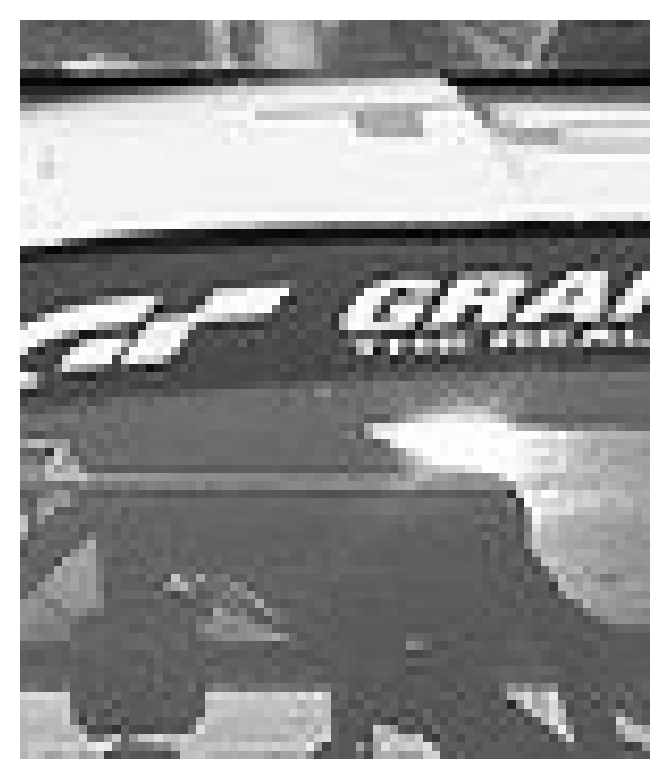

In [ ]:
plt.axis('off')
plt.imshow(img_cropped, cmap='gray')

In [ ]:
img_cropped.shape

(88, 75)

Юзаем SIFT-детектор

In [ ]:
sift = cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(img_cropped, None)
kp2, des2 = sift.detectAndCompute(img1, None)

Нам необходимо сопоставить контрольные точки и соответсвующие дескрипторы одного изображения с другим. Для этого можно использовать BFMatcher (Brute-force matcher):

In [ ]:
bf = cv2.BFMatcher(cv2.NORM_L1,crossCheck=True)
#crossCheck=false - совпадения вида один ко многим, crossCheck=true - совпадения вида один к одному
matches = bf.match(des1,des2)

Полученные совпадения в качестве аттрибутов имеют расстояние (по сути - это расстояние между двумя векторами, в нашем случае евклидово), индекс, соответсвующий первому изображению, индекс, соответсвующий второму изображению.

Отсортируем совпадения от лучшего к худшему в зависимости от аттрибута distance (чем меньше, тем лучше).

In [ ]:
matches = sorted(matches, key = lambda x:x.distance)
print('Количество совпадений ', len(matches))
for i in range(0,3): #выведем первые 3
  print('Расстояние ',matches[i].distance,'Индекс 1 ',matches[i].trainIdx,'Индекс 2 ', matches[i].queryIdx)

Количество совпадений  45
Расстояние  0.0 Индекс 1  1015 Индекс 2  5
Расстояние  0.0 Индекс 1  1044 Индекс 2  8
Расстояние  0.0 Индекс 1  1046 Индекс 2  9


In [ ]:
matches[0].queryIdx

5

In [ ]:
kp2[1015].pt

(615.2620239257812, 411.12298583984375)

In [ ]:
img_1[411][615]

array([255, 247, 250], dtype=uint8)

Выведем полученный результат для лучших 5 совпадений с помощью функции cv2.drawMatches, где укажем исходные изображения, контрольные точки (на этом шаге уже можем вернуться к исходным цветным).

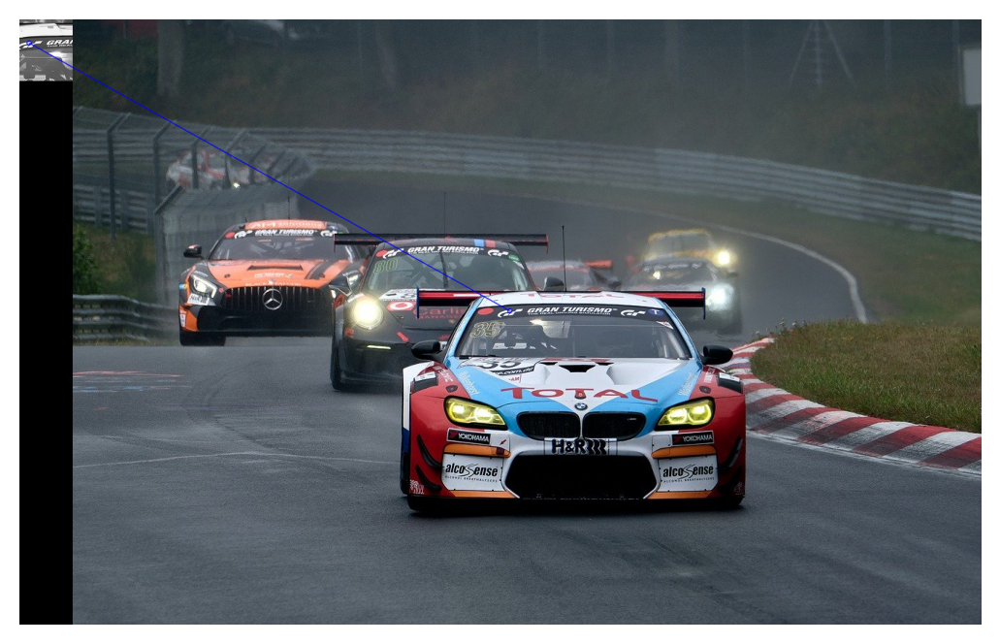

In [ ]:
matching_result = cv2.drawMatches(img_cropped, kp1, img_1, kp2, matches[:1], None, [255,0,0], flags=2)
mpl.rcParams['figure.dpi'] = 200
plt.axis('off')
plt.imshow(cv2.cvtColor(matching_result, cv2.COLOR_BGR2RGB))

# New task (CAR)

In [ ]:
img_rgb = cv2.imread("car1.jpg")

In [ ]:
img_rgb.shape

(3648, 5472, 3)

In [ ]:
img_1 = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
img_cropped = img_1[2500:2850, 4000:4500]

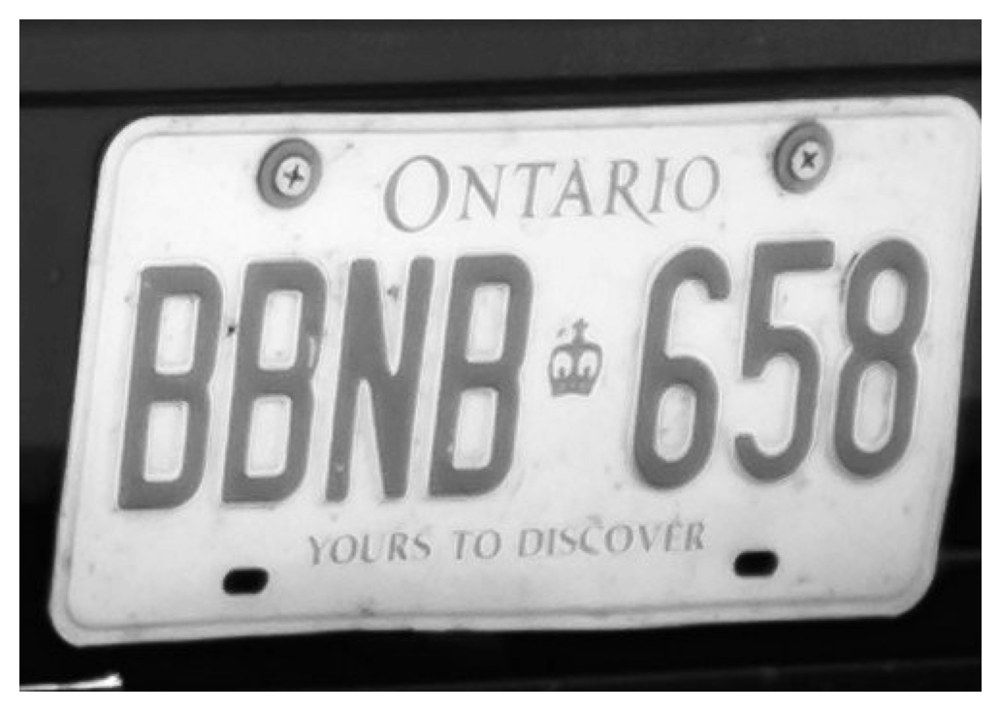

In [ ]:
plt.axis('off')
plt.imshow(img_cropped, cmap='gray')

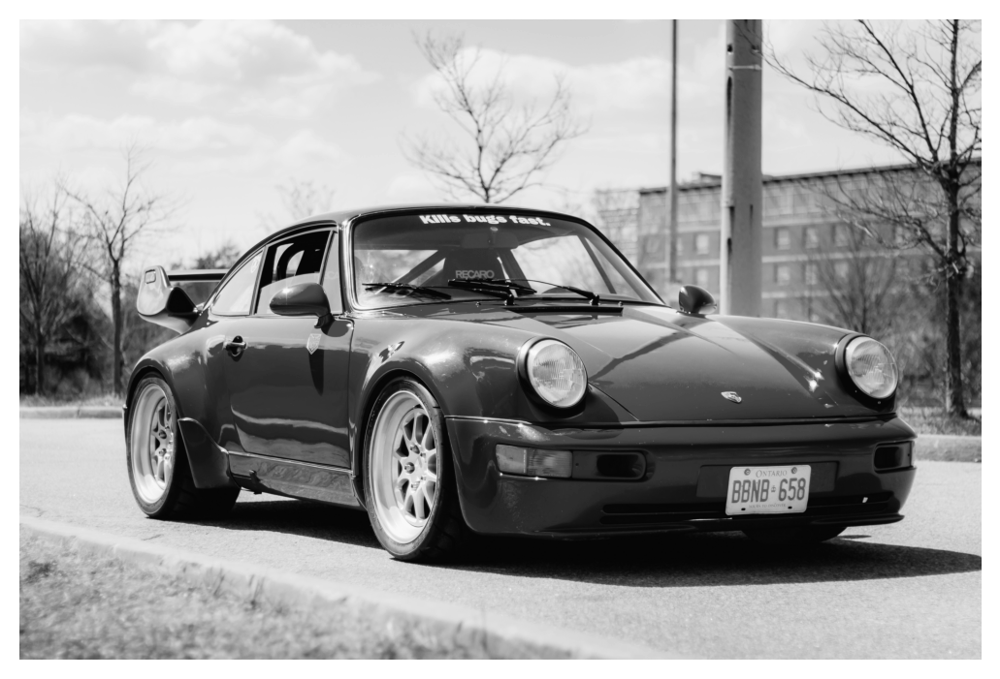

In [ ]:
plt.axis('off')
plt.imshow(img_1, cmap='gray')

In [ ]:
sift = cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(img_cropped, None)
kp2, des2 = sift.detectAndCompute(img_1, None)

In [ ]:
bf = cv2.BFMatcher(cv2.NORM_L1,crossCheck=True)
#crossCheck=false - совпадения вида один ко многим, crossCheck=true - совпадения вида один к одному
matches = bf.match(des1,des2)

In [ ]:
matches = sorted(matches, key = lambda x:x.distance)
print('Количество совпадений ', len(matches))
for i in range(0,3): #выведем первые 3
  print('Расстояние ',matches[i].distance,'Индекс 1 ',matches[i].trainIdx,'Индекс 2 ', matches[i].queryIdx)

Количество совпадений  446
Расстояние  0.0 Индекс 1  7060 Индекс 2  1
Расстояние  0.0 Индекс 1  7102 Индекс 2  4
Расстояние  0.0 Индекс 1  7111 Индекс 2  6


Найдем координаты нулевой точки (лучшей по расстоянию) на исходном изображении

In [ ]:
(y,x) = kp2[matches[0].trainIdx].pt

In [ ]:
(int(x),int(y))

(2782, 4025)

In [ ]:
img_rgb[int(x)][int(y)] # искомая точка

array([ 98, 111, 127], dtype=uint8)

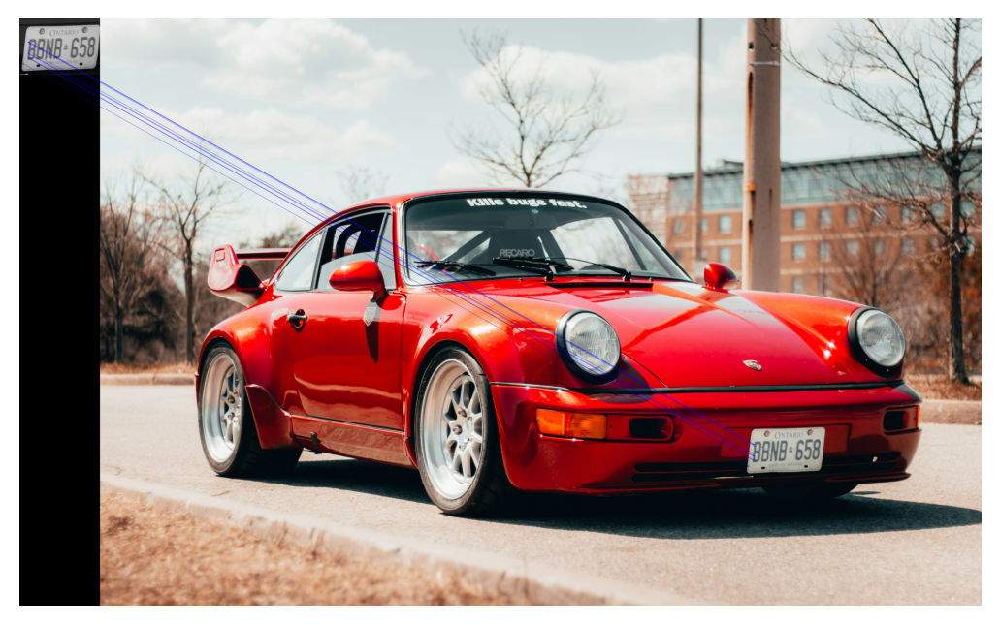

In [ ]:
matching_result = cv2.drawMatches(img_cropped, kp1, img_rgb, kp2, matches[:10], None, [255,0,0], flags=2)
mpl.rcParams['figure.dpi'] = 200
plt.axis('off')
plt.imshow(cv2.cvtColor(matching_result, cv2.COLOR_BGR2RGB))

# New task (Vienna)

In [ ]:
img_rgb = cv2.imread("vienna.jpg")

In [ ]:
img_rgb.shape

(2900, 4364, 3)

In [ ]:
img_1 = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
img_cropped = img_1[1800:2050, 2800:3100]

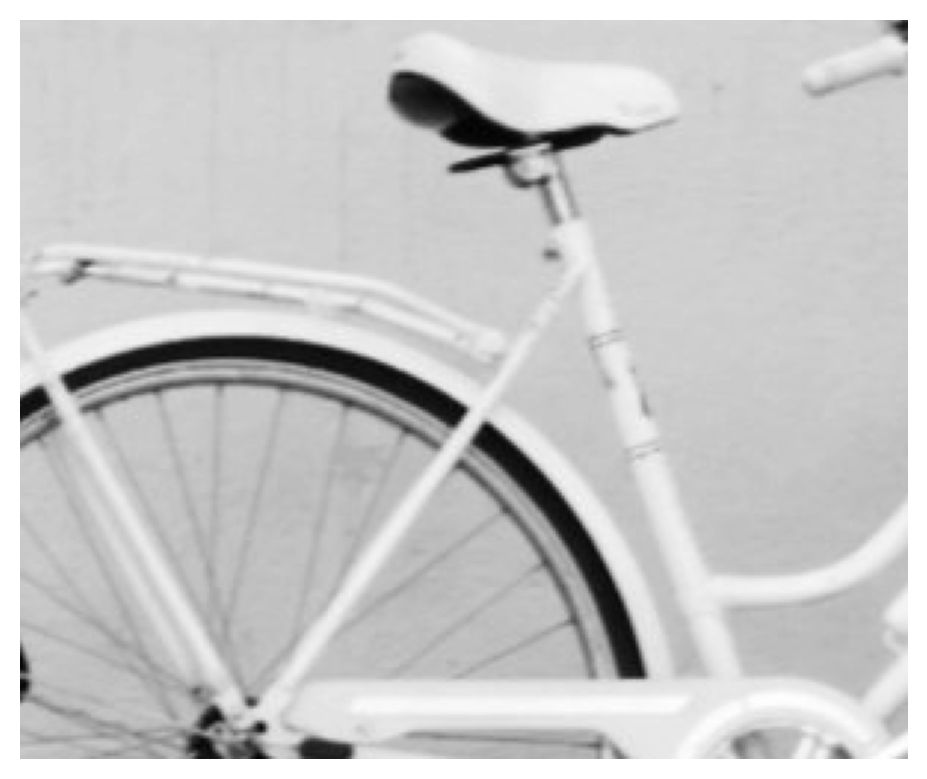

In [ ]:
plt.axis('off')
plt.imshow(img_cropped, cmap='gray')

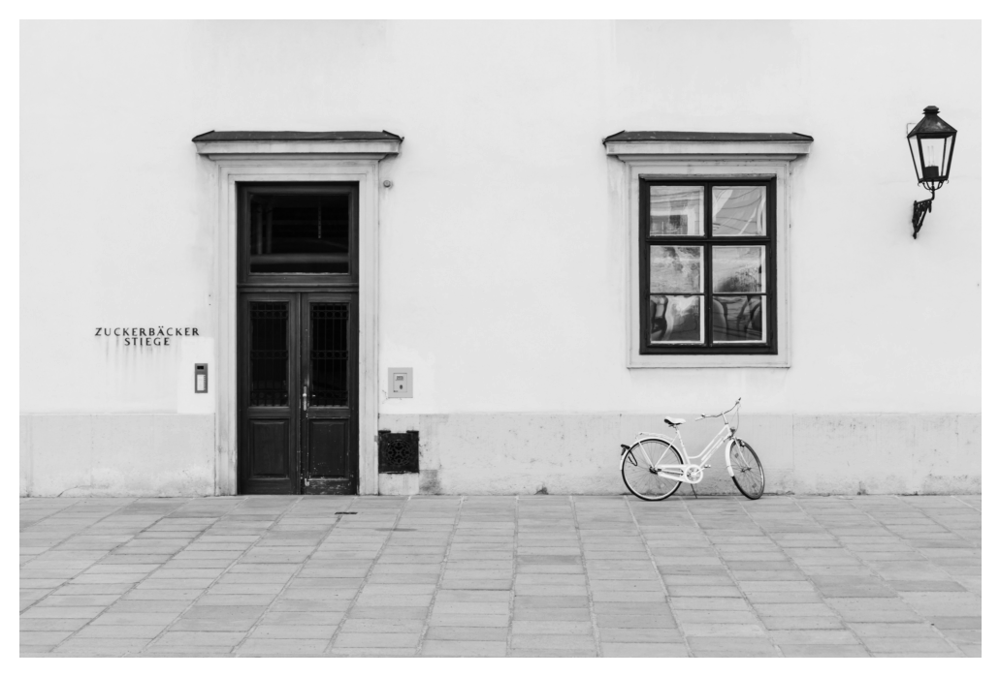

In [ ]:
plt.axis('off')
plt.imshow(img_1, cmap='gray')

In [ ]:
sift = cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(img_cropped, None)
kp2, des2 = sift.detectAndCompute(img_1, None)

In [ ]:
bf = cv2.BFMatcher(cv2.NORM_L1,crossCheck=True)
#crossCheck=false - совпадения вида один ко многим, crossCheck=true - совпадения вида один к одному
matches = bf.match(des1,des2)

In [ ]:
matches = sorted(matches, key = lambda x:x.distance)
print('Количество совпадений ', len(matches))
for i in range(0,3): #выведем первые 3
  print('Расстояние ',matches[i].distance,'Индекс 1 ',matches[i].trainIdx,'Индекс 2 ', matches[i].queryIdx)

Количество совпадений  169
Расстояние  0.0 Индекс 1  2038 Индекс 2  15
Расстояние  0.0 Индекс 1  2039 Индекс 2  16
Расстояние  0.0 Индекс 1  2043 Индекс 2  17


Найдем координаты нулевой точки (лучшей по расстоянию) на исходном изображении

In [ ]:
(y,x) = kp2[matches[0].trainIdx].pt

In [ ]:
(int(x),int(y))

(2034, 2819)

In [ ]:
img_rgb[int(x)][int(y)] # искомая точка

array([123, 143, 161], dtype=uint8)

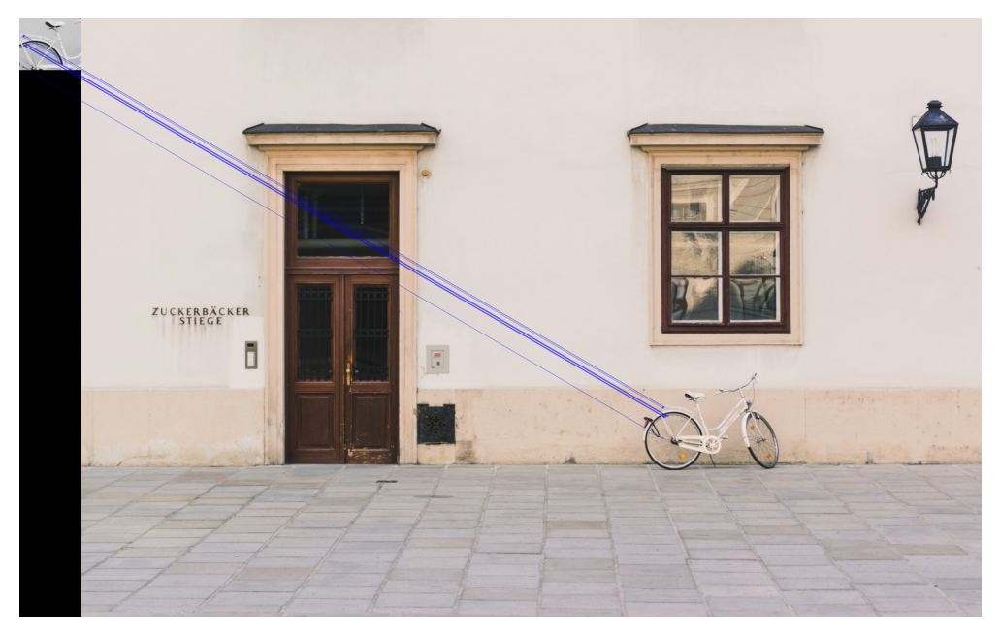

In [ ]:
matching_result = cv2.drawMatches(img_cropped, kp1, img_rgb, kp2, matches[:10], None, [255,0,0], flags=2)
mpl.rcParams['figure.dpi'] = 200
plt.axis('off')
plt.imshow(cv2.cvtColor(matching_result, cv2.COLOR_BGR2RGB))

# New task (Roses)

In [ ]:
img_rgb = cv2.imread("roses.jpg")

In [ ]:
img_rgb.shape

(3588, 5890, 3)

In [ ]:
img_1 = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
img_cropped = img_1[2000:2350, 1500:1900]

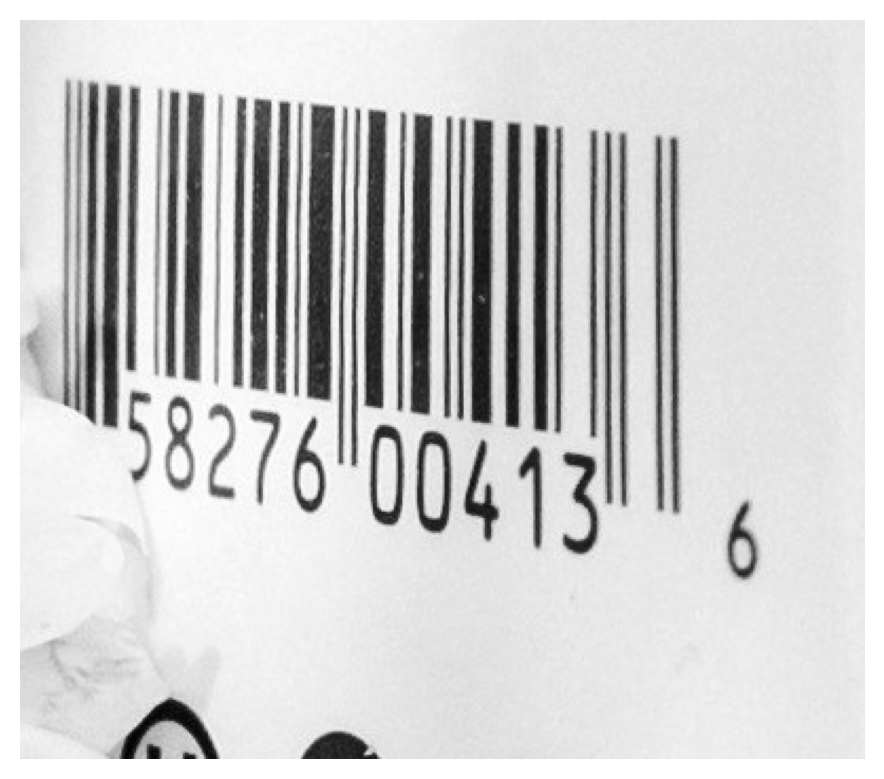

In [ ]:
plt.axis('off')
plt.imshow(img_cropped, cmap='gray')

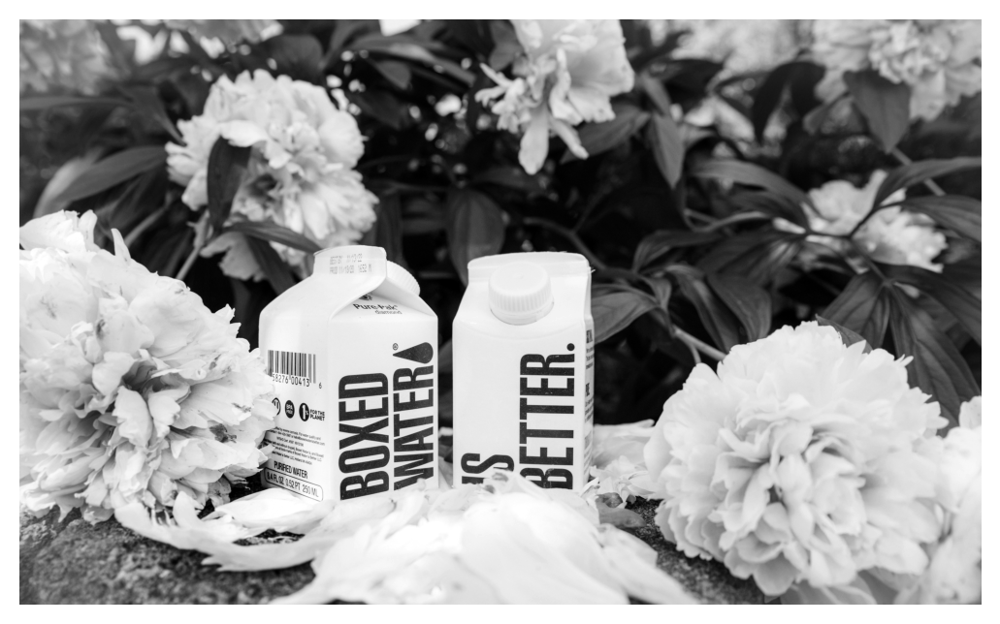

In [ ]:
plt.axis('off')
plt.imshow(img_1, cmap='gray')

In [ ]:
sift = cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(img_cropped, None)
kp2, des2 = sift.detectAndCompute(img_1, None)

In [ ]:
bf = cv2.BFMatcher(cv2.NORM_L1,crossCheck=True)
#crossCheck=false - совпадения вида один ко многим, crossCheck=true - совпадения вида один к одному
matches = bf.match(des1,des2)

In [ ]:
matches = sorted(matches, key = lambda x:x.distance)
print('Количество совпадений ', len(matches))
for i in range(0,3): #выведем первые 3
  print('Расстояние ',matches[i].distance,'Индекс 1 ',matches[i].trainIdx,'Индекс 2 ', matches[i].queryIdx)

Количество совпадений  376
Расстояние  0.0 Индекс 1  1857 Индекс 2  3
Расстояние  0.0 Индекс 1  1860 Индекс 2  4
Расстояние  0.0 Индекс 1  1867 Индекс 2  5


Найдем координаты нулевой точки (лучшей по расстоянию) на исходном изображении

In [ ]:
(y,x) = kp2[matches[0].trainIdx].pt

In [ ]:
(int(x),int(y))

(2295, 1515)

In [ ]:
img_rgb[int(x)][int(y)] # искомая точка

array([159, 176, 195], dtype=uint8)

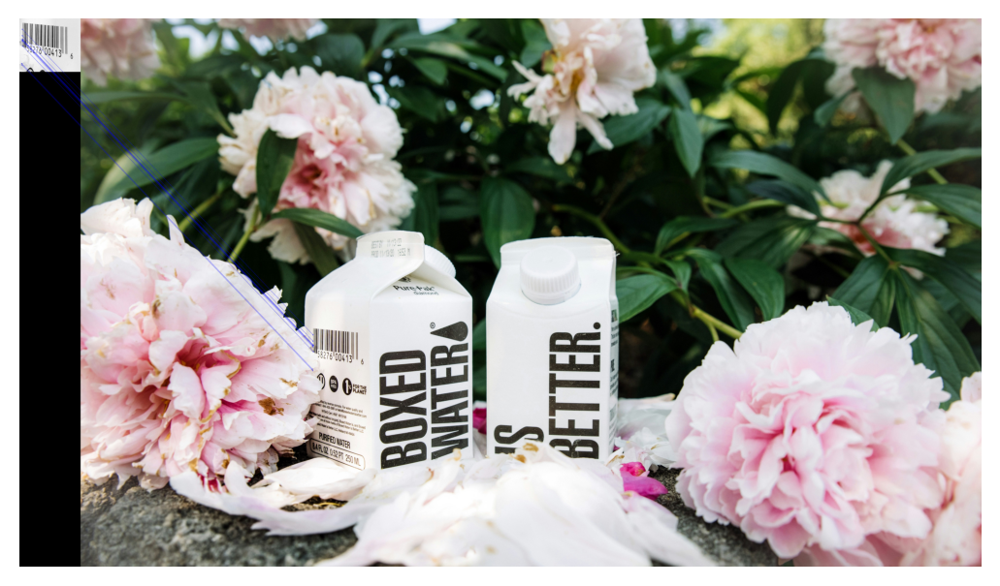

In [ ]:
matching_result = cv2.drawMatches(img_cropped, kp1, img_rgb, kp2, matches[:10], None, [255,0,0], flags=2)
mpl.rcParams['figure.dpi'] = 200
plt.axis('off')
plt.imshow(cv2.cvtColor(matching_result, cv2.COLOR_BGR2RGB))

# New task (Florence)

In [ ]:
img_rgb = cv2.imread("florence.jpg")

In [ ]:
img_rgb.shape

(3744, 5616, 3)

In [ ]:
img_1 = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
img_cropped = img_1[2200:2750, 1900:2500]

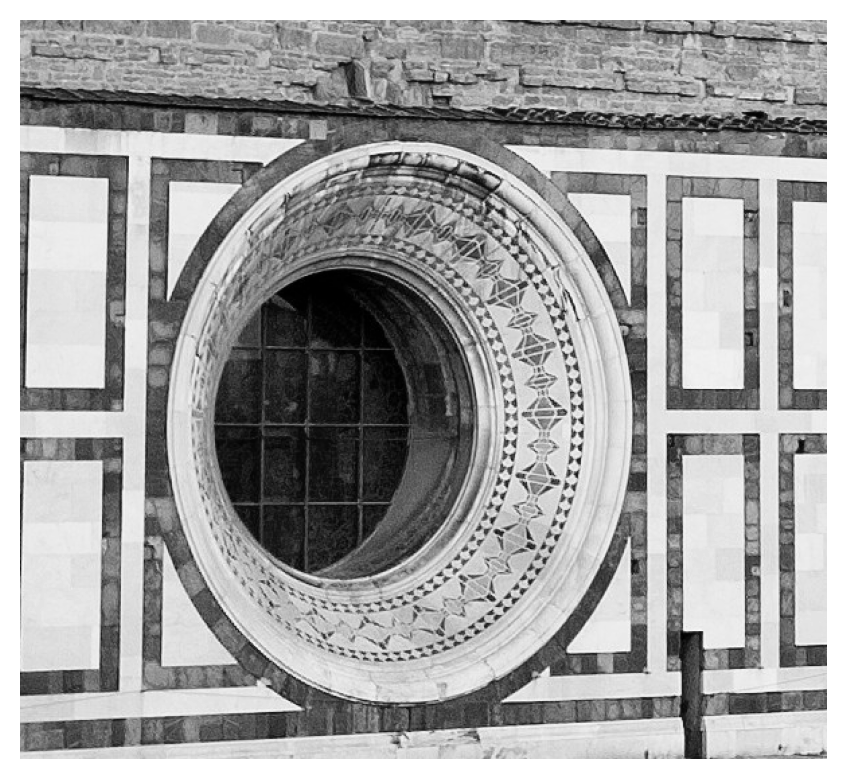

In [ ]:
plt.axis('off')
plt.imshow(img_cropped, cmap='gray')

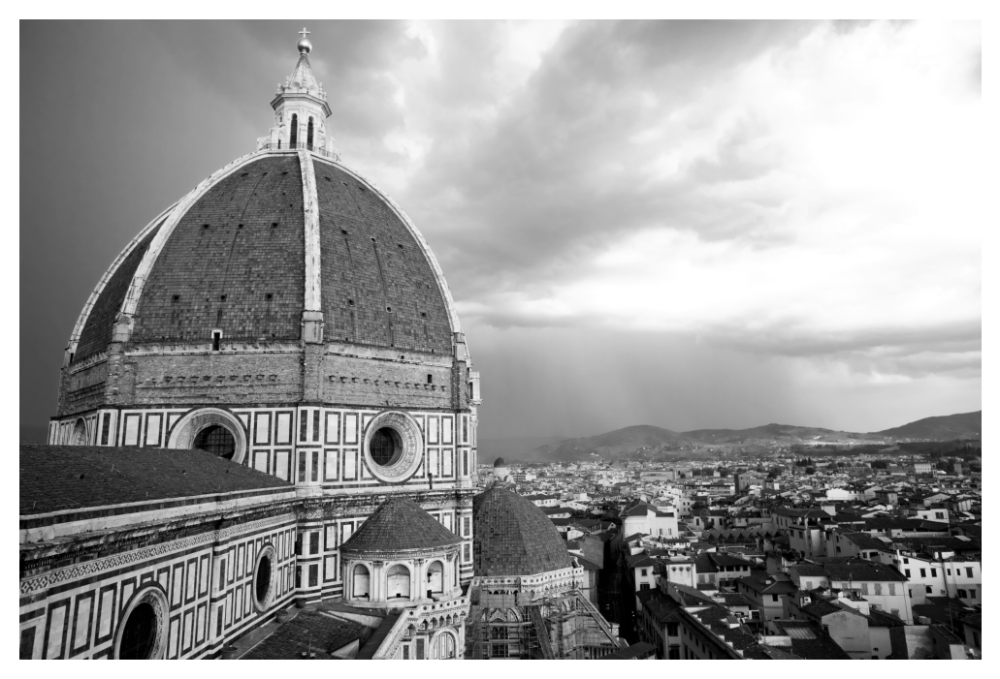

In [ ]:
plt.axis('off')
plt.imshow(img_1, cmap='gray')

In [ ]:
sift = cv2.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(img_cropped, None)
kp2, des2 = sift.detectAndCompute(img_1, None)

In [ ]:
bf = cv2.BFMatcher(cv2.NORM_L1,crossCheck=True)
#crossCheck=false - совпадения вида один ко многим, crossCheck=true - совпадения вида один к одному
matches = bf.match(des1,des2)

In [ ]:
matches = sorted(matches, key = lambda x:x.distance)
print('Количество совпадений ', len(matches))
for i in range(0,3): #выведем первые 3
  print('Расстояние ',matches[i].distance,'Индекс 1 ',matches[i].trainIdx,'Индекс 2 ', matches[i].queryIdx)

Количество совпадений  3664
Расстояние  0.0 Индекс 1  60607 Индекс 2  27
Расстояние  0.0 Индекс 1  60633 Индекс 2  30
Расстояние  0.0 Индекс 1  60673 Индекс 2  31


Найдем координаты нулевой точки (лучшей по расстоянию) на исходном изображении

In [ ]:
(y,x) = kp2[matches[0].trainIdx].pt

In [ ]:
(int(x),int(y))

(2216, 1909)

In [ ]:
img_rgb[int(x)][int(y)] # искомая точка

array([ 63, 114, 140], dtype=uint8)

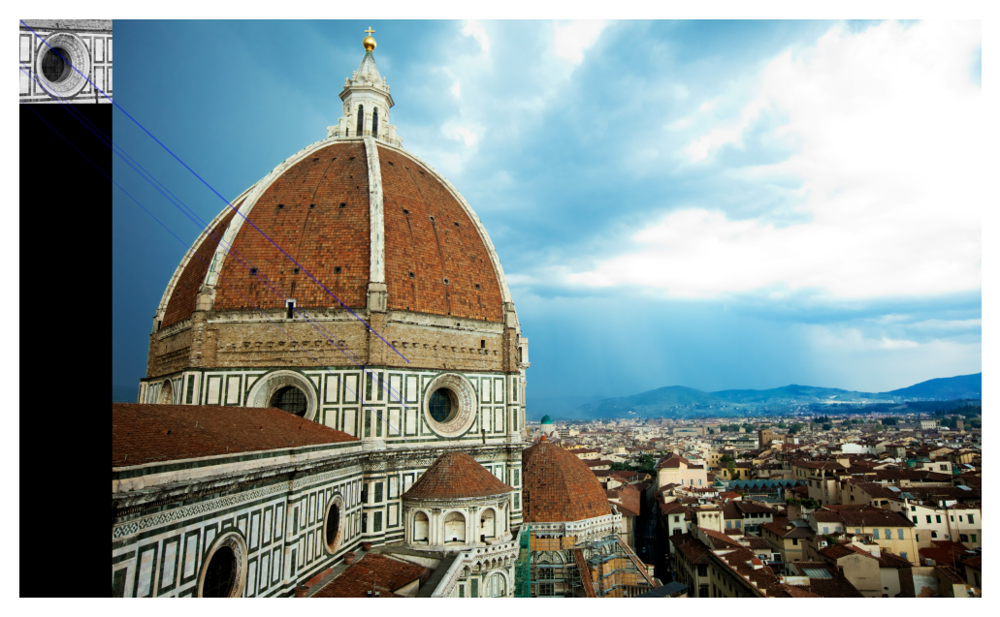

In [ ]:
matching_result = cv2.drawMatches(img_cropped, kp1, img_rgb, kp2, matches[:10], None, [255,0,0], flags=2)
mpl.rcParams['figure.dpi'] = 200
plt.axis('off')
plt.imshow(cv2.cvtColor(matching_result, cv2.COLOR_BGR2RGB))